# Análisis de personajes con grafos 🕸️

En este documento se crea un grafo para representar la relación que existe entre los diferentes personajes de la novela de *Juego de Tronos*.

## Bibliotecas necesarias

In [1]:
from IPython.display import Image as ShowImage
from itertools import combinations, product
import community as community_louvain
from matplotlib import pyplot as plt
import matplotlib.colors as mcolors
from pyvis.network import Network
from collections import Counter
from functools import reduce
from  matplotlib import cm
import networkx as nx
import pandas as pd
import numpy as np
import matplotlib
import json
import os
import re
import AC

## Funciones a utilizar

In [2]:
# Compile a regular expression pattern from an especific word
def getPattern(word:str) -> re.Pattern:
    'Compile a regular expression pattern from an especific word.'
    return re.compile(r'\b({0})\b'.format(word), flags=re.IGNORECASE)

# Return if a pattern appears in the sentence
def isPatternInSentence(pattern:re.Pattern, sentence:str) -> bool:
    'Return if a pattern appears in the sentence.'
    return True if pattern.search(sentence) else False

# Return a list of characters that appear in the sentence
def findCharactersInSentence(characters:dict, sentence:str) -> list:
    'Return a list of characters that appear in the sentence.'
    found = []
    for name,aliases in characters.items():
        patterns = [getPattern(alias) for alias in aliases]
        if any(isPatternInSentence(pattern, sentence) for pattern in patterns):
            found.append(name)
    return found

def findAllAppearances(chapter:str, characters:dict) -> list:
    'Return a list of list of all characters appearances in the chapter.'
    # Split all sentences of the chapter
    sentences = chapter.split('. ')
    appearances = []
    # For every sentence get a list of character appearances
    for sentence in sentences:
        appears = findCharactersInSentence(characters, sentence)
        # Patch
        if 'Jon Arryn' in appears:
            appears.remove('Jon Snow')
        appearances.append(appears)
    return appearances

def findAllRelations(appearances:list, window:int=3) -> list:
    'Find all relations in a list of apperances.'
    # Get number of lines
    N = len(appearances)
    # List to store all relations
    all_relations = []
    for i, line_appearances in enumerate(appearances):
        # If characters appears in the line of text
        if line_appearances:
            ia = min(i+1+window,N)
            # Get all apperances inside the window
            window_appearances = sum(appearances[i+1:ia],[])
            # Get all relations between the line and window apperances
            window_relations = [set(relation) for relation in product(line_appearances,window_appearances)]
            # Keep a relation if the characters are different
            window_relations = [relation for relation in window_relations if len(relation) > 1]
            # Get all relations inside the line of apperances
            line_relations = [set(relation) for relation in combinations(line_appearances,r=2)]
            # If relation exist append the result to all relations
            relations = window_relations + line_relations
            if relations:
                all_relations.append(relations)
    return sum(all_relations,[])

def show_dict(dictionary, end=None):
    if end:
        temp = list(dictionary.items())
        dictionary = dict(temp[:end])
    for key,value in dictionary.items():
        print(f'{key}: {value}')
        
def createTableOfRelations(relations:list) -> pd.DataFrame:
    # Create a dictionary with the count of every relation
    relationCount = dict(Counter(frozenset(relation) for relation in relations))
    # Create a tuple from the dictionary
    data = [(*relation,value) for relation,value in relationCount.items()]
    # Create and return the pandas data frame with all values
    return pd.DataFrame(data, columns=['source','target','value'])

def getTopInteractions(G, top=3):
    topInteractions = dict()
    for node in G.nodes():
        temp = dict()
        for neighbour in G.neighbors(node):
            value = G.get_edge_data(node,neighbour)['value']
            temp[neighbour] = value
        interactions = {key:temp[key] for key in sorted(temp, key=temp.get, reverse=True)[:top]}
        topInteractions[node] = interactions
    return topInteractions

def getColorMap(G):
    node_degree = dict(G.degree())
    minima = min(node_degree.values())
    maxima = max(node_degree.values())
    norm = matplotlib.colors.Normalize(vmin=minima, vmax=maxima, clip=True)
    mapper = cm.ScalarMappable(norm=norm, cmap=cm.cool)
    colors = dict()
    for key,value in node_degree.items():
        colors[key] = mcolors.to_hex(mapper.to_rgba(value))
    return colors

---

# Representación de la red

## Obtención del texto completo

Para este proyecto se utilizó el libro de *A Game of Thrones* de George R.R Martin. De este se extraerá todas las relaciones entre personajes y luego se obtendrá un grafo que represente a estas relaciones.

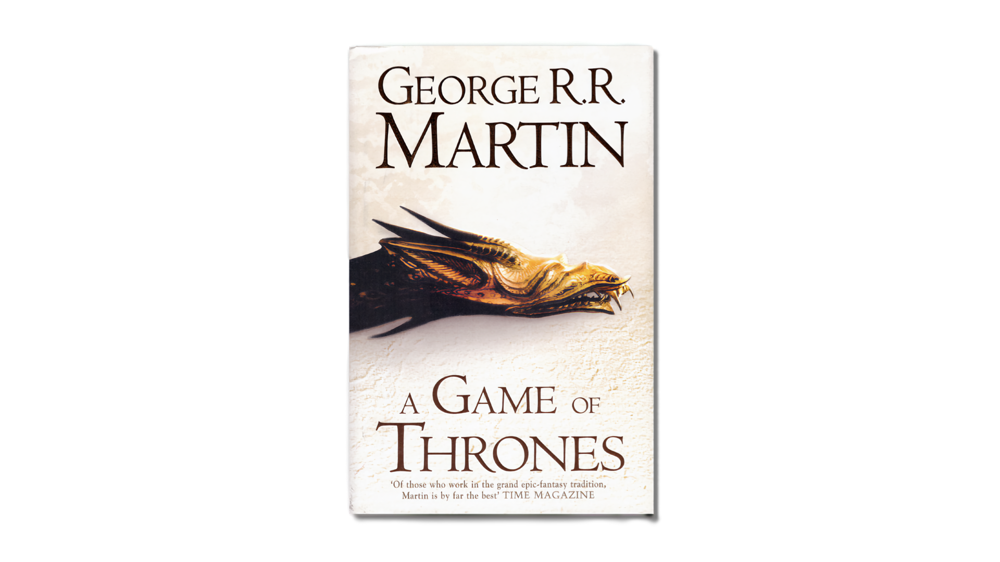

In [3]:
ShowImage('Imagenes/libro.png')

La primera parte es obtener el libro (leer archivo .txt) y luego obtener todos los capítulos por separado (divididos en una lista), para después poder obtener las apariciones de cada personaje.

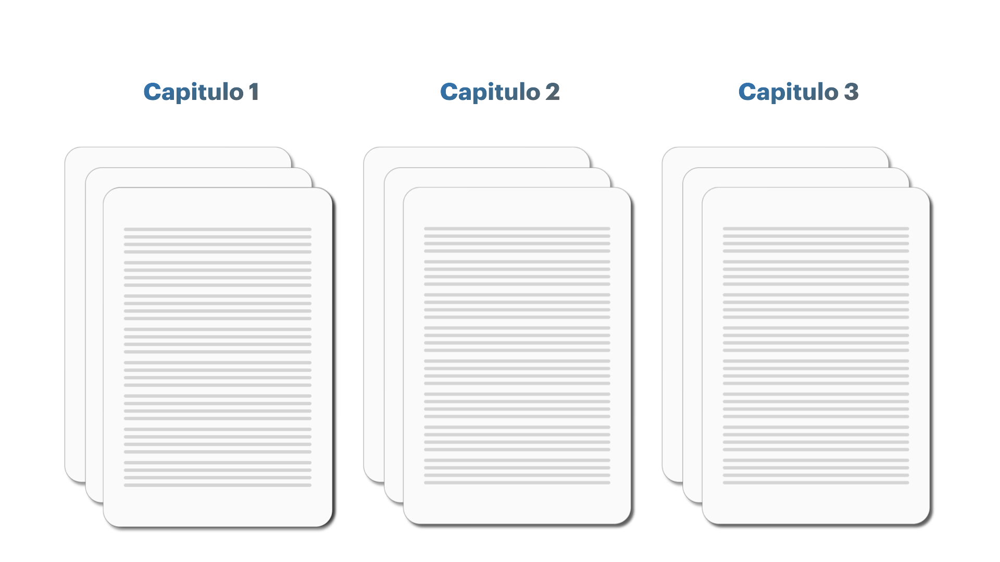

In [4]:
ShowImage('Imagenes/capitulos.png') 

In [5]:
with open('Archivos/gameofthrones.txt') as novel: 
    novel_lines = novel.readlines()
    repls = ('“', ''), ('”', ''), ('\n','')
    novel_lines = [reduce(lambda a, kv: a.replace(*kv), repls, line) for line in novel_lines if line != '\n']
    chapter_indx = [-1] + [i for i,line in enumerate(novel_lines) if line.count(' ') == 0 and line.isupper()]
    chapters_name = ['PROLOGUE'] + [novel_lines[i] for i in chapter_indx[1:]]
    complete_chapters = [' '.join(novel_lines[i+1:j]) for i,j in zip(chapter_indx[:-1],chapter_indx[1:])]

del novel_lines, chapter_indx

**Primeras 500 palabras de los 5 primeros capítulos:**

In [6]:
for chapter, chapter_name in zip(complete_chapters[:5],chapters_name[:5]):
    print(f'*** {chapter_name} ***')
    print(chapter[:200], end='....\n\n')
print(10*'.')

*** PROLOGUE ***
We should start back, Gared urged as the woods began to grow dark around them. The wildlings are dead. Do the dead frighten you? Ser Waymar Royce asked with just the hint of a smile. Gared did not ris....

*** BRAN ***
The morning had dawned clear and cold, with a crispness that hinted at the end of summer. They set forth at daybreak to see a man beheaded, twenty in all, and Bran rode among them, nervous with excite....

*** CATELYN ***
Catelyn had never liked this godswood. She had been born a Tully, at Riverrun far to the south, on the Red Fork of the Trident. The godswood there was a garden, bright and airy, where tall redwoods sp....

*** DAENERYS ***
Her brother held the gown up for her inspection. This is beauty. Touch it. Go on. Caress the fabric. Dany touched it. The cloth was so smooth that it seemed to run through her fingers like water. She ....

*** EDDARD ***
The visitors poured through the castle gates in a river of gold and silver and polished steel, thr

## Definición de personajes

Una vez que se obtiene el texto completo se definen los personajes manualmente.

In [7]:
with open('characters.json') as json_file:
    characters = json.load(json_file)

Para este libro contiene 57 personajes, según lo mencionado en https://bookanalysis.com/george-r-r-martin/a-game-of-thrones/characters-list/.

In [8]:
len(characters)

57

**Se muestran los primeros diez personajes y algunos de sus alias:**

In [9]:
show_dict(characters, 10)

Eddard Stark: ['Eddard Stark', 'Eddard', 'Ned', 'Lord Stark']
Bran Stark: ['Bran Stark', 'Bran']
Jon Snow: ['Jon Snow', 'Jon']
Daenerys Targaryen: ['Daenerys Targaryen', 'Daenerys', 'Dany', 'Khaleesi']
Viserys Targaryen: ['Viserys Targaryen', 'Viserys']
Khal Drogo: ['Khal Drogo']
Robb Stark: ['Robb Stark', 'Robb']
Arya Stark: ['Arya Stark', 'Arya']
Catelyn Stark: ['Catelyn Stark', 'Catelyn']
Sansa Stark: ['Sansa Stark', 'Sansa']


## Búsqueda de personajes

La búsqueda de los personajes en el texto se obtuvo para cada oración, obteniendo así una lista de longitud igual al número de oraciones en el capítulo. Un ejemplo de esto se muestra en la siguiente imagen:

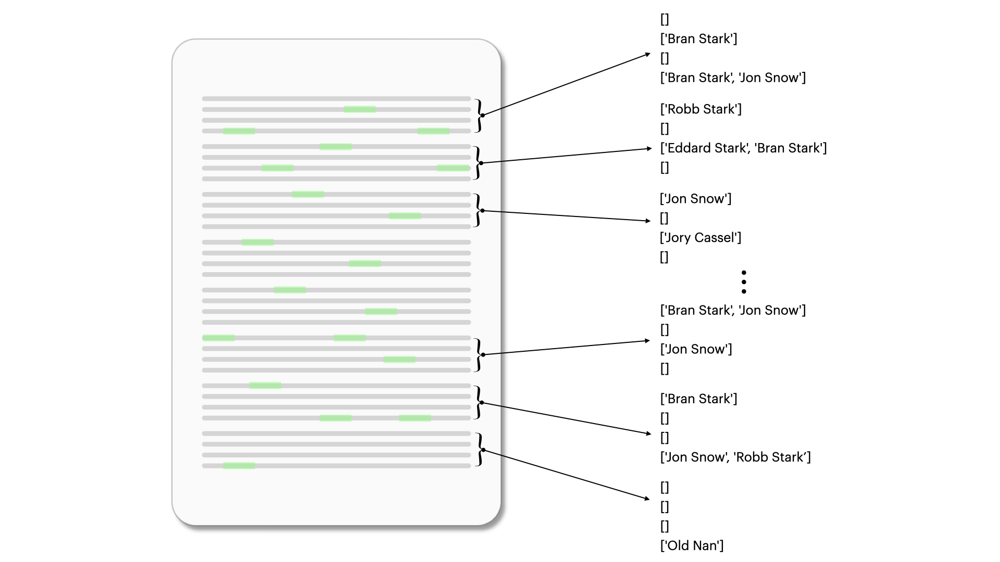

In [10]:
ShowImage('Imagenes/encontrarPersonajes.png')

Una vez que se obtiene la lista de apariciones para cada capítulo, se crea una lista de estas mismas.

In [11]:
all_appearances = [findAllAppearances(chapter, characters) for chapter in complete_chapters]

**Personajes que aparecen en las oraciones 230 a 250 en el capítulo 5:**

In [12]:
all_appearances[6][230:250]

[[],
 ['Arya Stark', 'Catelyn Stark', 'Sansa Stark'],
 [],
 ['Bran Stark'],
 ['Bran Stark'],
 ['Eddard Stark', 'Bran Stark'],
 [],
 ['Eddard Stark'],
 ['Robb Stark', 'Joffrey Baratheon', 'Ser Rodrik Cassel'],
 [],
 ['Bran Stark'],
 [],
 ['Robert Baratheon'],
 [],
 ['Catelyn Stark'],
 [],
 ['Eddard Stark', 'Bran Stark'],
 ['Robb Stark', 'Rickon Stark'],
 [],
 []]

## Definición de relaciones

Una vez que se obtiene la lista de apariciones, se pueden obtener las relaciones entre los personajes. Donde un personaje esta relacionado con otro si se encuentra dentro de una ventana de cierto tamaño. Por ejemplo, en la siguiente figura la ventana consiste en las siguientes tres oraciones de la oración a analizar.

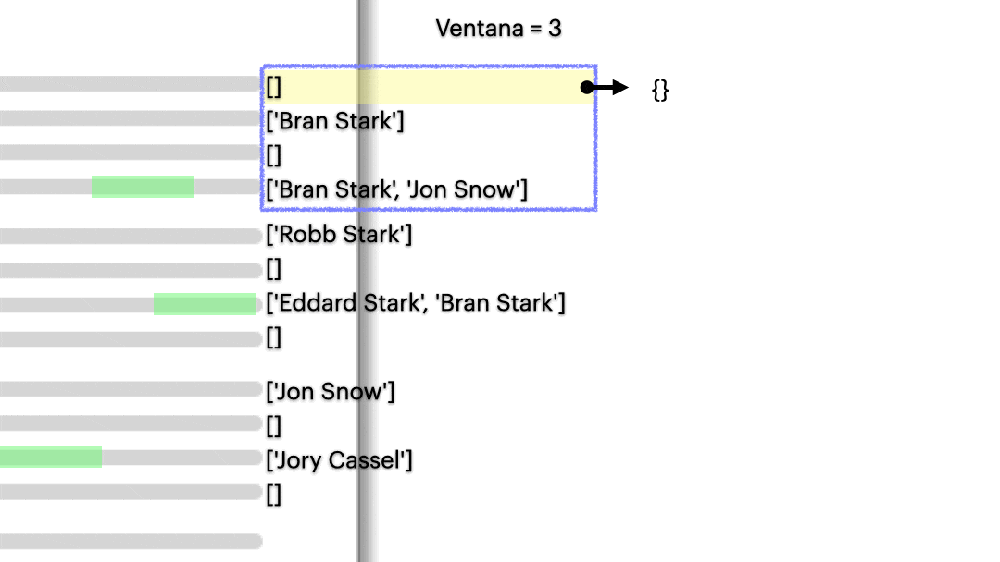

In [13]:
ShowImage('Imagenes/relaciones.gif')

Las relaciones se obtienen por capítulo, luego se realiza un agregado de todas estas en una sola lista. Finalmente, se toma esta lista y se construye una tabla, donde se expresa la cantidad de veces que se repite una relación dada.

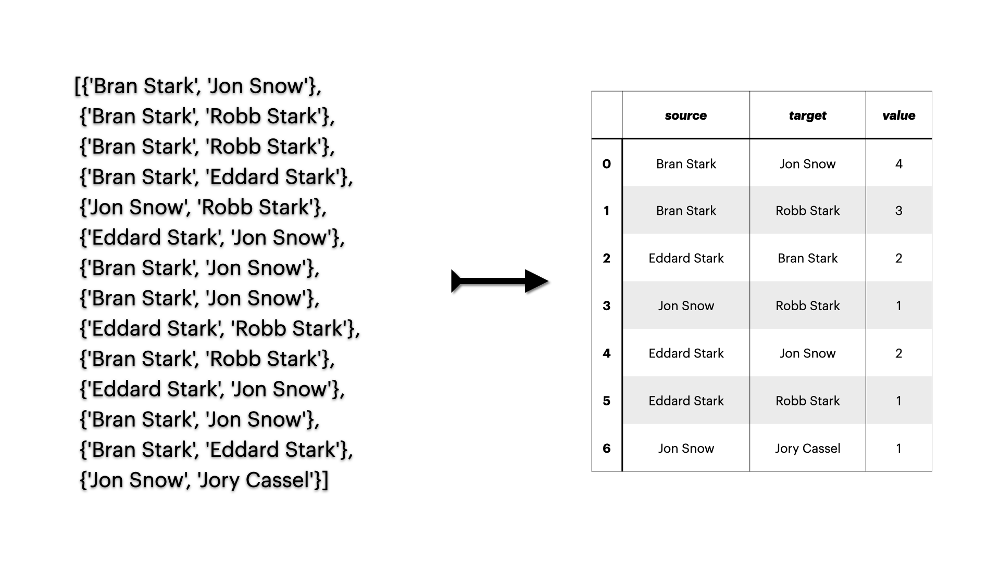

In [14]:
ShowImage('Imagenes/conteoRelaciones.png')

In [15]:
relations = sum((findAllRelations(a, window=3) for a in all_appearances),[])
print(f'Relaciones encontradas: {len(relations)}')

Relaciones encontradas: 20826


Se construye la tabla de relaciones (donde el orden de los personajes en la relación no tiene relevancia) solo con aquellas que tengan 5 apariciones o más:

In [16]:
relationsTable = createTableOfRelations(relations)
relationsTable = relationsTable.query('value >= 5')

**Relaciones con más repeticiones en el texto:**

In [17]:
relationsTable.nlargest(10, columns=['value'])

,source,target,value
25,Eddard Stark,Robert Baratheon,517
136,Hodor,Bran Stark,453
1,Robb Stark,Bran Stark,416
85,Joffrey Baratheon,Sansa Stark,416
39,Arya Stark,Sansa Stark,365
64,Daenerys Targaryen,Jorah Mormont,355
109,Catelyn Stark,Robb Stark,339
95,Cersei Lannister,Tyrion Lannister,308
364,Bronn,Tyrion Lannister,297
138,Maester Luwin,Bran Stark,270


---

# Visualización de la red

Se construye un objeto de networkx a partir del pandas dataframe previamente calculado.

In [18]:
G = nx.from_pandas_edgelist(relationsTable, edge_attr=True)

Se agregan algunos atributos extra a la red.

In [19]:
# Size of the node
node_degree = dict(G.degree)
nx.set_node_attributes(G, node_degree, name='size')
# Color of the nodes to show
colors = getColorMap(G)
nx.set_node_attributes(G, colors, name='color')

Una vez que se construye la gráfica obtenemos el grado de todos los nodos y obtenemos el histograma

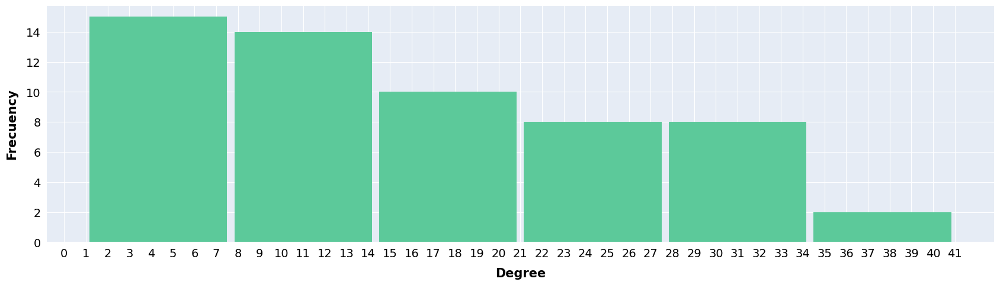

In [20]:
degree_values = list(node_degree.values())
fig, ax = AC.createFigures(figsize=(20,5))
ax.hist(degree_values, bins=6, rwidth=0.95, color=AC.specialGreen);
ax.set_xticks(range(max(degree_values)+1));
ax.set_xlabel('Degree', fontdict=dict(size=15, weight='bold'));
ax.set_ylabel('Frecuency', fontdict=dict(size=15, weight='bold'));

Luego utilizando la biblioteca pyvis se realiza la visualización de la red.

In [21]:
# Initialization of the object
net = Network(notebook=True, height='800px', width='100%', bgcolor='#222222', font_color='white', cdn_resources='remote')
# Creation of the pyvis graph
net.from_nx(G)
# Find and show the top relation of every node
topInteractions = getTopInteractions(G)
for node in net.nodes:
    node['title'] = f'{node["id"]}\n Top neighbors:\n-' + '\n-'.join(topInteractions[node['id']])
# Show the graph
net.force_atlas_2based()
net.show('game_of_thrones_graph.html')

game_of_thrones_graph.html


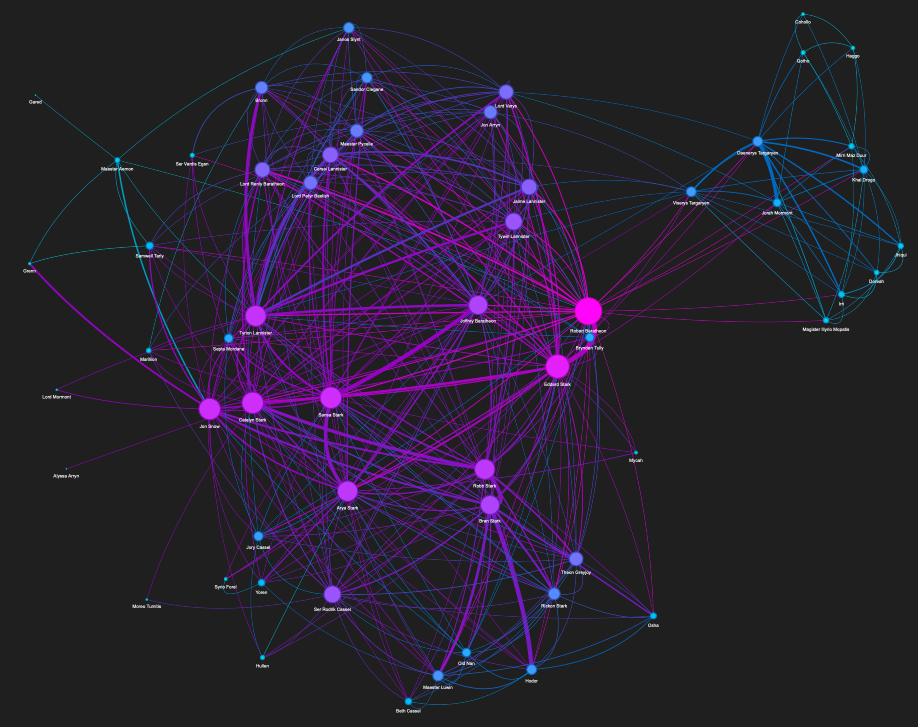

In [39]:
ShowImage('Imagenes/graph.png')

El grafo muestra las relaciones que existen entre los diferentes personajes de la novela. Entre más recurrente sea la relación entre los personajes, más gruesa será la arista entre ellos. Asimismo, al colocar el mouse sobre cada nodo, se muestran los tres personajes con los que existe una relación más recurrente.

---

# Análisis de la red

A continuación se realiza un analisis global de las caracteristicas de este grafo generado.

## Tamaño de la red

Se obtiene el tamaño de la red, lo cual es equivalente al número de relaciones encontradas.

In [22]:
G.size()

450

## Densidad de la red

El valor de la densidad parece no ser muy alto, aunque en la visualización a simple vista de la red si parece estar muy conectada.

In [23]:
nx.density(G)

0.2819548872180451

## Longitud promedio de los caminos más cortos

El camino más corto promedio para todos los posibles pares de nodos en la red es muy cercano a 2.

In [24]:
nx.average_shortest_path_length(G)

1.944235588972431

## Excentricidad

La excentricidad de un nodo *v* es la distancia maxima entre *v* y todos los demás nodos del grafo *G*.

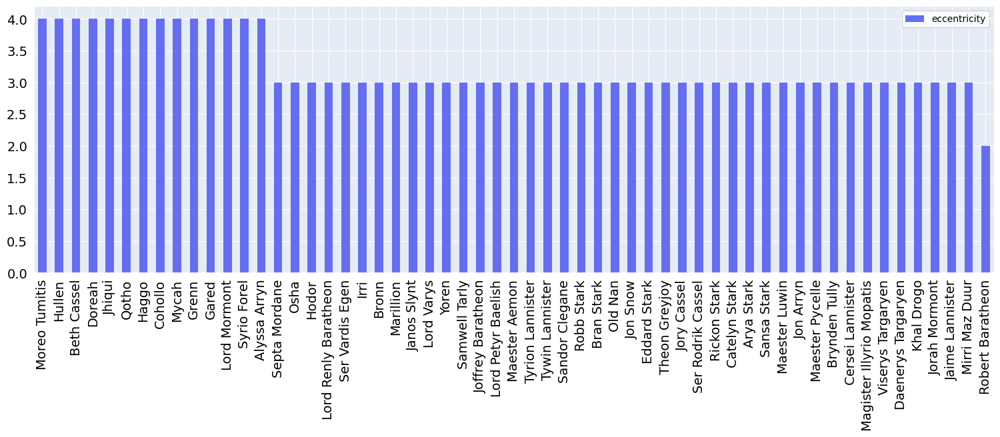

In [25]:
fig, ax = AC.createFigures(figsize=(18,5))
eccentricity = pd.DataFrame.from_dict(nx.eccentricity(G), orient='index', columns=['eccentricity'])
eccentricity = eccentricity.sort_values('eccentricity', ascending=False)
eccentricity.plot(kind='bar', ax=ax, color=AC.specialPurple, grid=True);

Observando la gráfica se puede apreciar que la mayoría de los nodos están a una distancia máxima de 3 de todos los otros nodos dentro de la red. El diámetro de la red (máxima excentricidad), que nos dice que tan lejos pueden estar dos nodos dentro de la red, es de 4. Por último, el radio de la red (mínima excentricidad) es igual a 2, donde el centro en este caso es el personaje *Robert Baratheon*.

## Centralidad

### Centralidad de grado

La centralidad de grado de un nodo *v* es la fracción de nodos a los que este esta conectado. En esta se puede ver como *Robert Baratheon* y la mayoría de la casa *Stark* cuentan con un gran número de conexión a otros nodos. Lo cual corresponde con la novela.

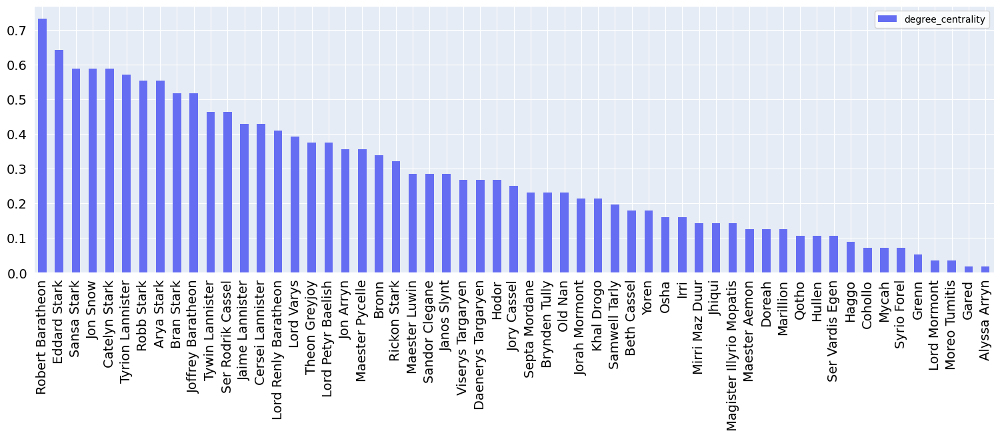

In [26]:
fig, ax = AC.createFigures(figsize=(18,5))
degree_centrality = pd.DataFrame.from_dict(nx.degree_centrality(G), orient='index', columns=['degree_centrality'])
degree_centrality = degree_centrality.sort_values('degree_centrality', ascending=False)
degree_centrality.plot(kind='bar', ax=ax, color=AC.specialPurple, grid=True);

### Centralidad de intermediación

En el caso de la centralidad de intermediación se puede ver claramente que *Robert Baratheon* es el personaje con el valor más alto. Esto puede ser debido a que, en un nodo, esta medida de centralidad nos da la probabilidad del camino más corto entre otros dos nodos elegidos aleatoriamente tengan que pasar por él. En este caso el personaje *Robert Baratheon* es el rey y el conflicto con el personaje, de cierta manera, arranca la historia de la novela.

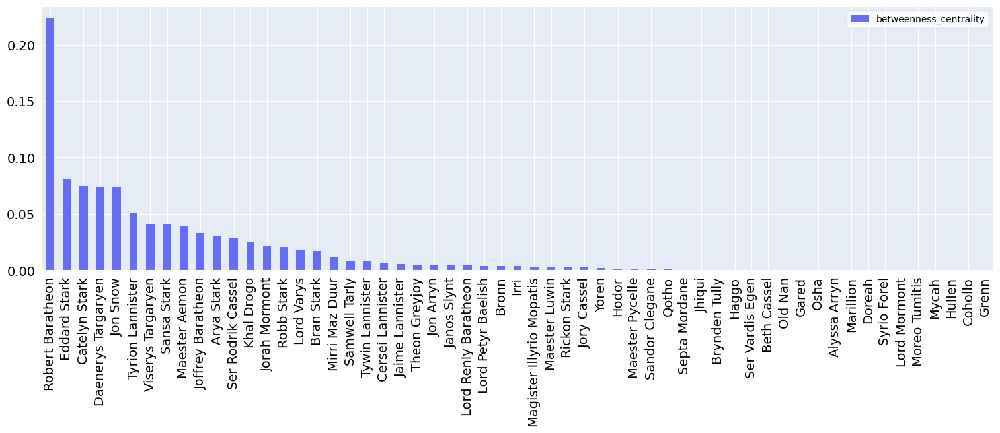

In [27]:
fig, ax = AC.createFigures(figsize=(18,5))
betweenness_centrality = pd.DataFrame.from_dict(nx.betweenness_centrality(G), orient='index', columns=['betweenness_centrality'])
betweenness_centrality = betweenness_centrality.sort_values('betweenness_centrality', ascending=False)
betweenness_centrality.plot(kind='bar', ax=ax, color=AC.specialPurple, grid=True);

### Centralidad de cercanía

En el caso de la centralidad por cercanía podemos observar como gran parte de los personajes tienen un valor alto, esto puede ser debido a los primeros capítulos de la novela, donde la mayoría de los personajes comparten una locación y puede que se mencionen en el texto con mucha cercanía unos de otros.

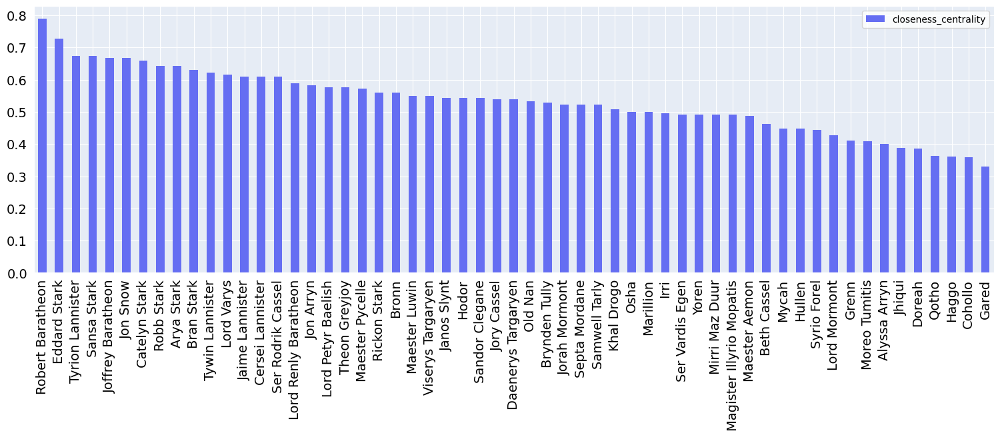

In [28]:
fig, ax = AC.createFigures(figsize=(18,5))
closeness_centrality = pd.DataFrame.from_dict(nx.closeness_centrality(G), orient='index', columns=['closeness_centrality'])
closeness_centrality = closeness_centrality.sort_values('closeness_centrality', ascending=False)
closeness_centrality.plot(kind='bar', ax=ax, color=AC.specialPurple, grid=True);

## Cúmulos

### Coeficiente de acumulación

Analizando el coeficiente de acumulación, se puede apreciar que los personajes secundarios son los que ahora tienen un valor más alto. Esto puede ser, ya que estos solo interactúan en tramas donde aparecen un número reducido de personajes que tienden a interactuar también entre ellos. Por ejemplo, 'Syrio Forel' solo interactúa con 'Arya Stark', 'Eddard Stark', 'Sansa Stark' y 'Yoren', que a su vez ellos también interactúan entre ellos, haciendo este coeficiente igual a 1.

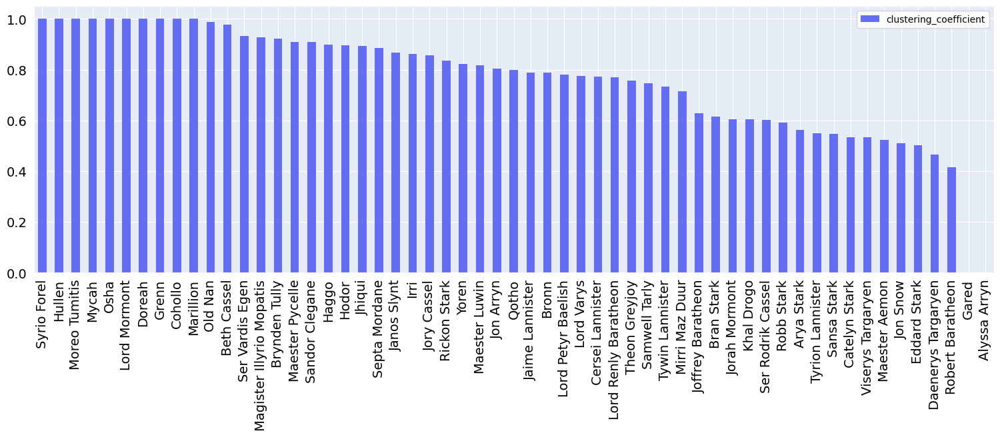

In [29]:
fig, ax = AC.createFigures(figsize=(18,5))
clustering_coefficient = pd.DataFrame.from_dict(nx.clustering(G), orient='index', columns=['clustering_coefficient'])
clustering_coefficient = clustering_coefficient.sort_values('clustering_coefficient', ascending=False)
clustering_coefficient.plot(kind='bar', ax=ax, color=AC.specialPurple, grid=True);

**Coeficiente de acumulación global**

Probabilidad promedio de que dos vecinos de un nodo dado sean vecinos entre ellos también.

In [30]:
nx.average_clustering(G)

0.7583940865259085

**Transitividad**

Esto nos dice la probabilidad de que los nodos dentro de la red se encuentren interconectados.

In [31]:
nx.transitivity(G)

0.6456089478044739

## Comunidades

Se obtiene la comunidad a la que pertenece cada nodo, según el método Louvain, para después obtener de nuevo la visualización de la red completa, con colores por comunidad detectada.

In [32]:
communities = community_louvain.best_partition(G)
nx.set_node_attributes(G, communities, 'group')

In [33]:
# Initialization of the object
net = Network(notebook=True,  height='800px', width='100%', bgcolor='#222222', font_color='white', cdn_resources='remote')
# Creation of the pyvis graph
net.from_nx(G)
net.force_atlas_2based()
net.show('game_of_thrones_graph_community.html')

game_of_thrones_graph_community.html


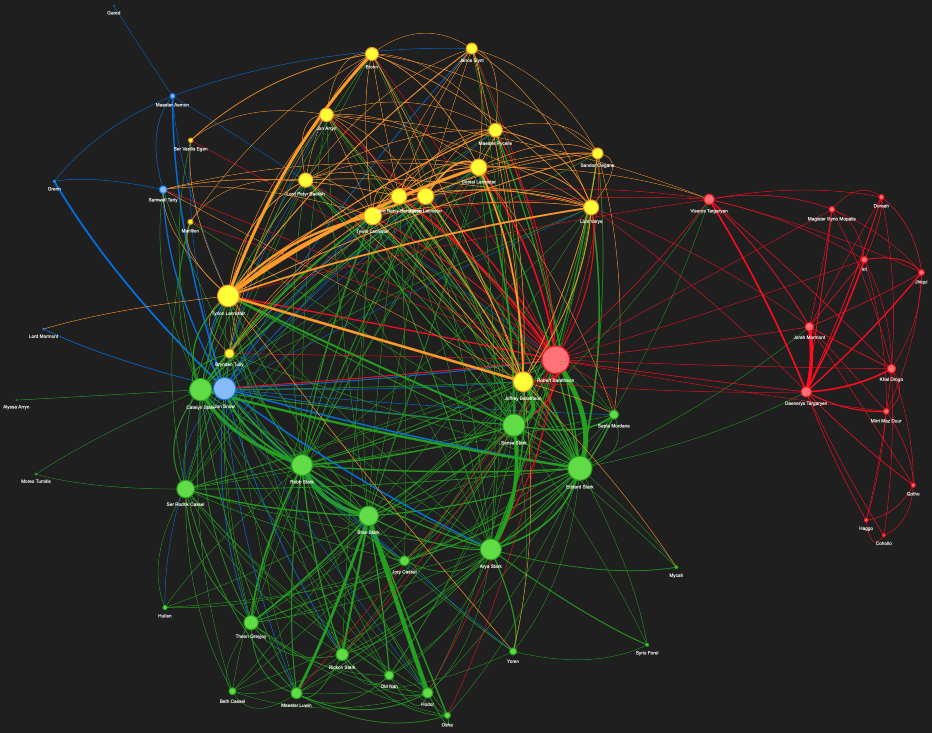

In [40]:
ShowImage('Imagenes/graph_community.png')

En esta red dividida por comunidades se puede apreciar de cierta manera las diferentes tramas dentro del libro, donde el color verde representa a los personajes que interactúan principalmente en la trama de *Winterfell*. Los nodos de color amarillo son aquellos personajes que aparecen más en la trama de *King's Landing*. Luego están los nodos de color rojo, que son aquellos personajes que aparecen mayoritariamente en la historia de *Daenerys Targaryen* y toda su travesía por Essos. Aunque hay que recalcar que es extraño que *Robert Baratheon* pertenezca a los nodos rojos, ya que la historia de este se desarrolla principalmente junto con los personajes de *King's Landing* (nodos amarillos). Finalmente, los nodos de color azul parecen representar la historia de *Jon Snow*. 